$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bm}[1]{{\bf #1}}
\newcommand{\bb}[1]{\bm{\mathrm{#1}}}
$$

# Part 2: Generative Adversarial Networks
<a id=part3></a>

In this part we will implement and train a generative adversarial network and apply it to the task of image generation.

In [151]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re
import zipfile

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Using device: cpu


### Obtaining the dataset
<a id=part3_1></a>

Let's begin by downloading a dataset of images that we want to learn to generate. 
We'll use the [Labeled Faces in the Wild](http://vis-www.cs.umass.edu/lfw/) (LFW) dataset which contains many labeled faces of famous individuals.

We're going to train our generative model to generate a specific face, not just any face.
Since the person with the most images in this dataset is former president George W. Bush, we'll set out to train a Bush Generator :)

However, if you feel adventurous and/or prefer to generate something else, feel free to edit the `PART2_CUSTOM_DATA_URL` variable in `hw3/answers.py`.


You can use a custom dataset, by editing the `PART3_CUSTOM_DATA_URL` variable in `hw3/answers.py`, and get a bonus!

In [152]:
import cs236781.plot as plot
import cs236781.download
from hw3.answers import PART3_CUSTOM_DATA_URL as CUSTOM_DATA_URL

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
if CUSTOM_DATA_URL is None:
    DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'
else:
    DATA_URL = CUSTOM_DATA_URL

_, dataset_dir = cs236781.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

File /Users/dtarko/.pytorch-datasets/George_W_Bush2.zip exists, skipping download.
Extracting /Users/dtarko/.pytorch-datasets/George_W_Bush2.zip...
Extracted 532 to /Users/dtarko/.pytorch-datasets/George_W_Bush/George_W_Bush


Create a `Dataset` object that will load the extraced images:

In [153]:
import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

OK, let's see what we got. You can run the following block multiple times to display a random subset of images from the dataset.

Found 530 images in dataset folder.


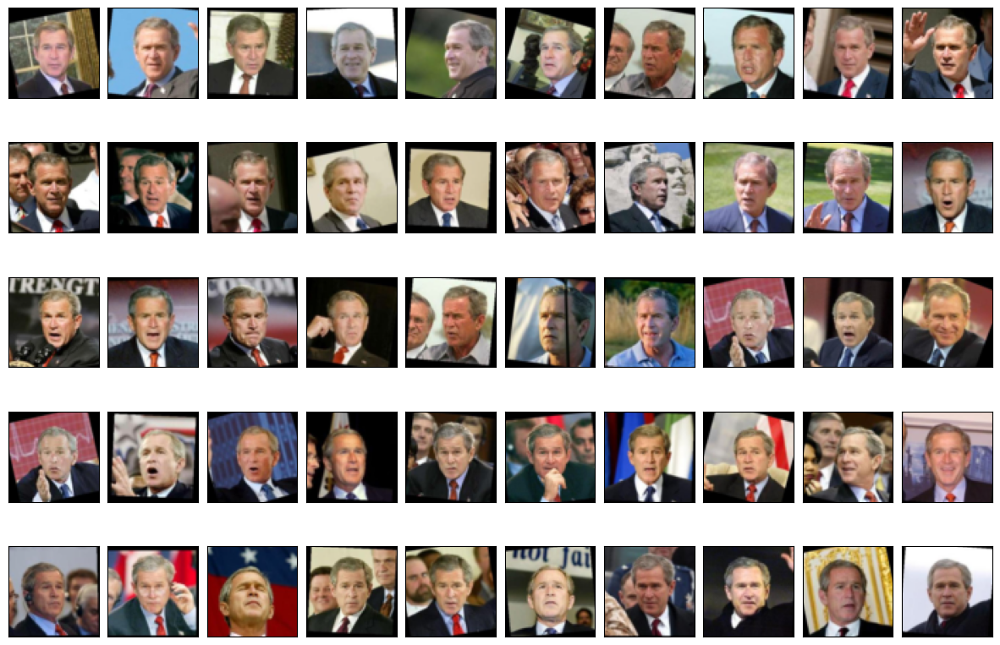

In [154]:
_ = plot.dataset_first_n(ds_gwb, 50, figsize=(15,10), nrows=5)
print(f'Found {len(ds_gwb)} images in dataset folder.')

In [155]:
x0, y0 = ds_gwb[0]
x0 = x0.unsqueeze(0).to(device)
print(x0.shape)

test.assertSequenceEqual(x0.shape, (1, 3, im_size, im_size))

torch.Size([1, 3, 64, 64])


## Generative Adversarial Nets (GANs)
<a id=part3_2></a>

GANs, first proposed in a [paper](https://arxiv.org/pdf/1406.2661.pdf) by Ian Goodfellow in 2014 are today arguably the most popular type of generative model. GANs are currently producing state of the art
results in generative tasks over many different domains.

In a GAN model, two different neural networks compete against each other: A **generator** and a **discriminator**.

- The Generator, which we'll denote as $\Psi _{\bb{\gamma}} : \mathcal{U} \rightarrow \mathcal{X}$, maps a latent-space variable
$\bb{u}\sim\mathcal{N}(\bb{0},\bb{I})$ to an instance-space variable $\bb{x}$ (e.g. an image).
Thus a parametric evidence distribution $p_{\bb{\gamma}}(\bb{X})$ is generated,
which we typically would like to be as close as possible to the real evidence distribution, $p(\bb{X})$.

- The Discriminator, $\Delta _{\bb{\delta}} : \mathcal{X} \rightarrow [0,1]$, is a network which,
given an instance-space variable $\bb{x}$, returns the  probability that $\bb{x}$ is real, i.e. that $\bb{x}$
was sampled from $p(\bb{X})$ and not $p_{\bb{\gamma}}(\bb{X})$.


<img src="imgs/gan.jpg" />

### Training GANs
<a id=part3_3></a>

The generator is trained to generate "fake" instances which will maximally fool the
discriminator into returning that they're real. Mathematically, the generator's parameters
$\bb{\gamma}$ should be chosen such as to **maximize** the expression
$$
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

The discriminator is trained to classify between real images, coming from the training set,
and fake images generated by the generator.
Mathematically, the discriminator's parameters $\bb{\delta}$ should be chosen such as to
**maximize** the expression
$$
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

These two competing objectives can thus be expressed as the following min-max optimization:
$$
\min _{\bb{\gamma}} \max _{\bb{\delta}} \,
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

A key insight into GANs is that we can interpret the above maximum as the *loss* with respect to
$\bb{\gamma}$:

$$
L({\bb{\gamma}}) =
\max _{\bb{\delta}} \, \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
  \mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

This means that the generator's loss function trains together with the generator
itself in an adversarial manner. In contrast, when training our VAE we used a fixed L2 norm
as a data loss term.

### Model Implementation
<a id=part3_4></a>

We'll now implement a Deep Convolutional GAN (DCGAN) model.
See the DCGAN [paper](https://arxiv.org/pdf/1511.06434.pdf) for architecture ideas and tips for training.

**TODO**: Implement the `Discriminator` class in the `hw3/gan.py` module.
If you wish you can reuse the `EncoderCNN` class from the VAE model as the first part of the Discriminator.

In [156]:
import hw3.gan as gan

dsc = gan.Discriminator(in_size=x0[0].shape).to(device)
print(dsc)

d0 = dsc(x0)
print(d0.shape)

test.assertSequenceEqual(d0.shape, (1,1))

Discriminator(
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2)
    (6): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2)
  )
  (fc): Linear(in_features=16384, out_features=1, bias=True)
)
torch.Size([1, 1])


**TODO**: Implement the `Generator` class in the `hw3/gan.py` module.
If you wish you can reuse the `DecoderCNN` class from the VAE model as the last part of the Generator.

In [157]:
z_dim = 128
gen = gan.Generator(z_dim, 4).to(device)
print(gen)

z = torch.randn(1, z_dim).to(device)
xr = gen(z)
print(xr.shape)

test.assertSequenceEqual(x0.shape, xr.shape)

Generator(
  (fc): Linear(in_features=128, out_features=8192, bias=True)
  (conv_layers): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): Tanh()
  )
)
torch.Size([1, 3, 64, 64])


### Loss Implementation
<a id=part3_5></a>

Let's begin with the discriminator's loss function.
Based on the above we can flip the sign and say we want to update the 
Discriminator's parameters $\bb{\delta}$ so that they **minimize** the expression
$$
- \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, - \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

We're using the Discriminator twice in this expression;
once to classify data from the real data distribution and
once again to classify generated data.
Therefore our loss should be computed based on these two terms.
Notice that since the discriminator returns a probability, we can formulate the above as two cross-entropy losses.

GANs are notoriously diffucult to train.
One common trick for improving GAN stability during training is to make the classification labels noisy for the discriminator. This can be seen as a form of regularization, to help prevent the discriminator from overfitting.

We'll incorporate this idea into our loss function. Instead of labels being equal to 0 or 1, we'll make them
"fuzzy", i.e. random numbers in the ranges $[0\pm\epsilon]$ and $[1\pm\epsilon]$.

**TODO**: Implement the `discriminator_loss_fn()` function in the `hw3/gan.py` module.

In [158]:
from hw3.gan import discriminator_loss_fn
torch.manual_seed(42)

y_data = torch.rand(10) * 10
y_generated = torch.rand(10) * 10

loss = discriminator_loss_fn(y_data, y_generated, data_label=1, label_noise=0.3)
print(loss)

test.assertAlmostEqual(loss.item(), 6.4808731, delta=1e-5)


tensor(6.4809)


Similarly, the generator's parameters $\bb{\gamma}$ should **minimize** the expression
$$
-\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) ))
$$

which can also be seen as a cross-entropy term. This corresponds to "fooling" the discriminator; Notice that the gradient of the loss w.r.t $\bb{\gamma}$ using this expression also depends on $\bb{\delta}$.

**TODO**: Implement the `generator_loss_fn()` function in the `hw3/gan.py` module.

In [159]:
from hw3.gan import generator_loss_fn
torch.manual_seed(42)

y_generated = torch.rand(20) * 10

loss = generator_loss_fn(y_generated, data_label=1)
print(loss)

test.assertAlmostEqual(loss.item(), 0.0222969, delta=1e-3)

tensor(0.0223)


### Sampling
<a id=part3_6></a>

Sampling from a GAN is straightforward, since it learns to generate data from an isotropic Gaussian latent space distribution.

There is an important nuance however. Sampling is required during the process of training the GAN, since
we generate fake images to show the discriminator.
As you'll seen in the next section,  in some cases we'll need our samples to have gradients (i.e., to be part of
the Generator's computation graph).

**TODO**: Implement the `sample()` method in the `Generator` class within the `hw3/gan.py` module.

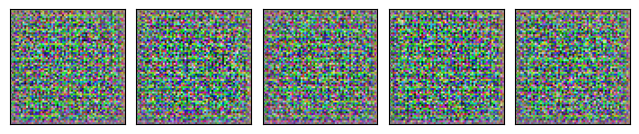

In [160]:
samples = gen.sample(5, with_grad=False)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNone(samples.grad_fn)
_ = plot.tensors_as_images(samples.cpu())

samples = gen.sample(5, with_grad=True)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNotNone(samples.grad_fn)

### Training
<a id=part3_7></a>

Training GANs is a bit different since we need to train two models simultaneously, each with it's own separate loss function and optimizer. We'll implement the training logic as a function that handles one batch of data
and updates both the discriminator and the generator based on it.

As mentioned above, GANs are considered hard to train. To get some ideas and tips you can see this [paper](https://arxiv.org/pdf/1606.03498.pdf), this list of ["GAN hacks"](https://github.com/soumith/ganhacks) or just do it the hard way :)

**TODO**:
1. Implement the `train_batch` function in the `hw3/gan.py` module.
2. Tweak the hyperparameters in the `part3_gan_hyperparams()` function within the `hw3/answers.py` module.

In [161]:
import torch.optim as optim
from torch.utils.data import DataLoader
from hw3.answers import part3_gan_hyperparams

torch.manual_seed(42)

# Hyperparams
hp = part3_gan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.Discriminator(im_size).to(device)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return gan.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])

# Training
checkpoint_file = 'checkpoints/gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

{'batch_size': 32, 'h_dim': 128, 'z_dim': 100, 'x_sigma2': 0.01, 'learn_rate': 0.0002, 'betas': (0.5, 0.999), 'discriminator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999)}, 'generator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999)}, 'data_label': 1.0, 'label_noise': 0.1}


**TODO**:
1. Implement the `save_checkpoint` function in the `hw3.gan` module. You can decide on your own criterion regarding whether to save a checkpoint at the end of each epoch.
1. Run the following block to train. It will sample some images from your model every few epochs so you can see the progress.
2. When you're satisfied with your results, rename the checkpoints file by adding `_final`. When you run the `main.py` script to generate your submission, the final checkpoints file will be loaded instead of running training. Note that your final submission zip will not include the `checkpoints/` folder. This is OK.

--- EPOCH 1/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.01s/it]
Discriminator loss: 0.047775998602018636
Generator loss:     11.772827485028435
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


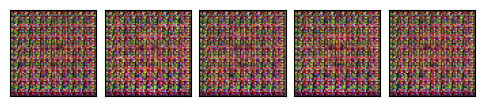

--- EPOCH 2/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.04s/it]
Discriminator loss: 0.10614640484837924
Generator loss:     14.776211345897002


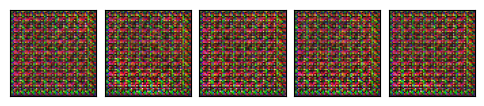

--- EPOCH 3/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.03s/it]
Discriminator loss: 0.03370464609607177
Generator loss:     8.153164442847757
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


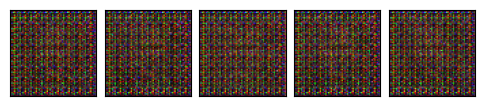

--- EPOCH 4/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.10s/it]
Discriminator loss: 0.03847205411533222
Generator loss:     7.42727658327888
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


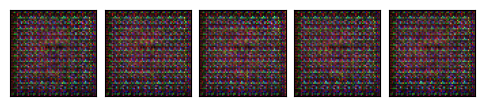

--- EPOCH 5/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.04s/it]
Discriminator loss: 0.013366545824443592
Generator loss:     8.587316625258502
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


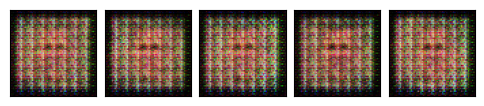

--- EPOCH 6/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.03s/it]
Discriminator loss: 1.3931221532471039
Generator loss:     11.962665914612657


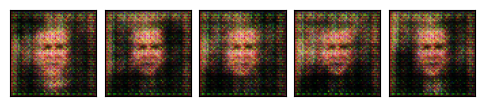

--- EPOCH 7/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.09s/it]
Discriminator loss: 0.340814269202597
Generator loss:     8.03454072335187


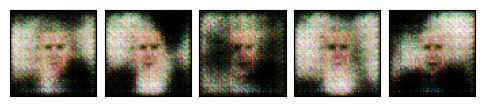

--- EPOCH 8/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.05s/it]
Discriminator loss: 0.5878663702922708
Generator loss:     4.786907048786388
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


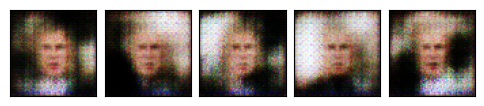

--- EPOCH 9/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.08s/it]
Discriminator loss: 0.4940213070196264
Generator loss:     4.369996414465063
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


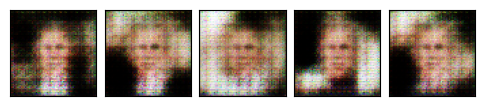

--- EPOCH 10/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.03s/it]
Discriminator loss: 0.5249851319719764
Generator loss:     4.85420908647425


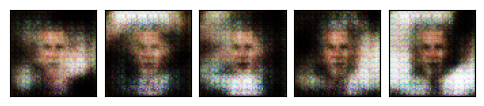

--- EPOCH 11/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.01s/it]
Discriminator loss: 0.3132410671781091
Generator loss:     4.437382936477661


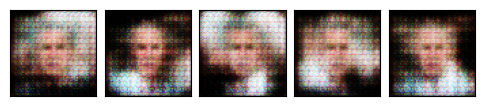

--- EPOCH 12/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.02s/it]
Discriminator loss: 0.21917346514323177
Generator loss:     4.2626136611489684
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


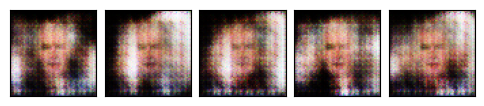

--- EPOCH 13/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.06s/it]
Discriminator loss: 0.17792110583361456
Generator loss:     4.17162353852216
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


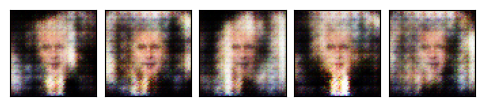

--- EPOCH 14/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.07s/it]
Discriminator loss: 0.3057503756135702
Generator loss:     5.260540562517503


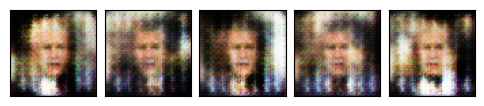

--- EPOCH 15/100 ---
100%|██████████| 17/17 [00:36<00:00,  2.15s/it]
Discriminator loss: 0.5231648864881957
Generator loss:     4.976194739341736


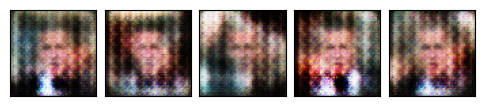

--- EPOCH 16/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.05s/it]
Discriminator loss: 0.45846795334535484
Generator loss:     4.195856143446529


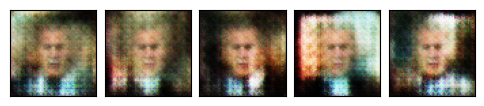

--- EPOCH 17/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.04s/it]
Discriminator loss: 0.31911521492635503
Generator loss:     3.8457234326530907
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


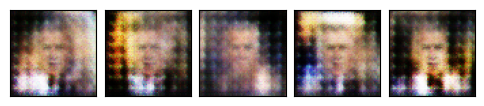

--- EPOCH 18/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.02s/it]
Discriminator loss: 0.5716750507845598
Generator loss:     4.674856508479399


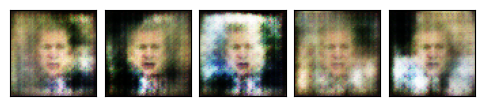

--- EPOCH 19/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.03s/it]
Discriminator loss: 0.5685620868907255
Generator loss:     4.343661409967086


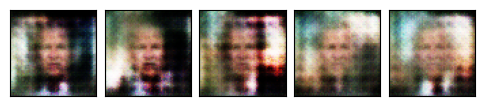

--- EPOCH 20/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.04s/it]
Discriminator loss: 0.404948865666109
Generator loss:     3.6150960641748764
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


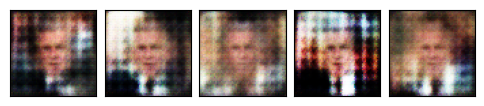

--- EPOCH 21/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.06s/it]
Discriminator loss: 0.3594718636835323
Generator loss:     4.02506215432111


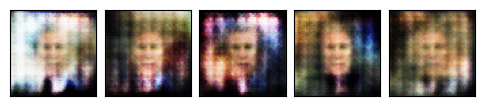

--- EPOCH 22/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.07s/it]
Discriminator loss: 0.5676783595015021
Generator loss:     4.157994747161865


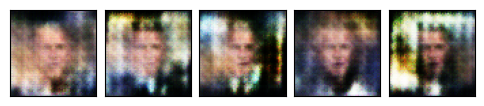

--- EPOCH 23/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.07s/it]
Discriminator loss: 0.3879709638216916
Generator loss:     3.659406718085794


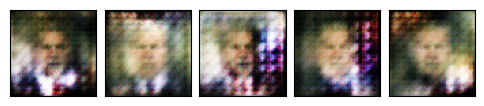

--- EPOCH 24/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.06s/it]
Discriminator loss: 0.3241015365895103
Generator loss:     3.9869018722982967


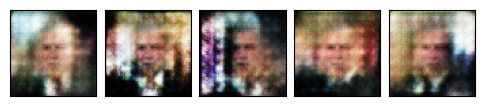

--- EPOCH 25/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.04s/it]
Discriminator loss: 0.4035847362350015
Generator loss:     3.860272098990048


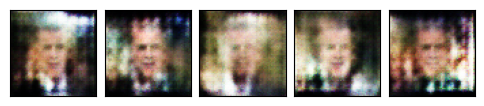

--- EPOCH 26/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.04s/it]
Discriminator loss: 0.3199791654067881
Generator loss:     3.6548542625763836


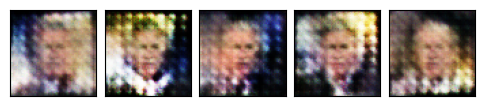

--- EPOCH 27/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.06s/it]
Discriminator loss: 0.7835325121003038
Generator loss:     4.353635283077464


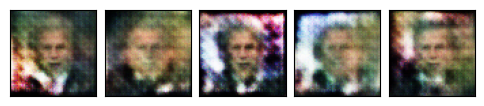

--- EPOCH 28/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.06s/it]
Discriminator loss: 0.4337116400985157
Generator loss:     3.4834403220344994
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


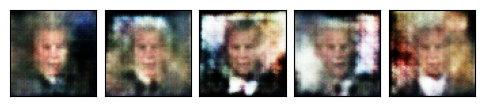

--- EPOCH 29/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.03s/it]
Discriminator loss: 0.24774157825638266
Generator loss:     3.265071321936215
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


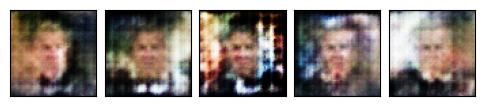

--- EPOCH 30/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.11s/it]
Discriminator loss: 0.3177812055629842
Generator loss:     3.6539010878871467


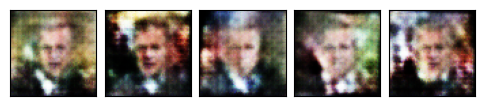

--- EPOCH 31/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.04s/it]
Discriminator loss: 0.5225807288113762
Generator loss:     3.6816906227785


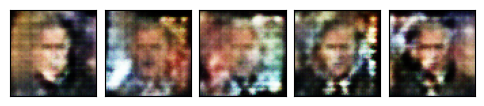

--- EPOCH 32/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.04s/it]
Discriminator loss: 0.3096526037244236
Generator loss:     3.5875724063200107


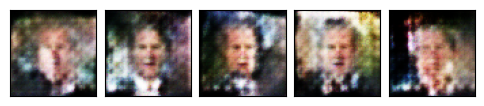

--- EPOCH 33/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.04s/it]
Discriminator loss: 0.32648200147292195
Generator loss:     3.925006053026985


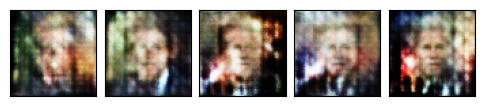

--- EPOCH 34/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.03s/it]
Discriminator loss: 0.3372532365953221
Generator loss:     3.860108024933759


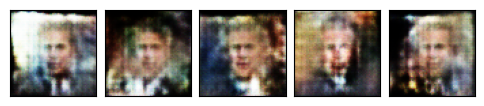

--- EPOCH 35/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.02s/it]
Discriminator loss: 0.8453554142923916
Generator loss:     4.38862934883903


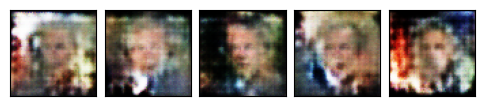

--- EPOCH 36/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.03s/it]
Discriminator loss: 0.4167899226441103
Generator loss:     3.5988662944120517


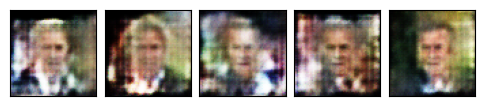

--- EPOCH 37/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.03s/it]
Discriminator loss: 0.5416246613158899
Generator loss:     3.786662781939787


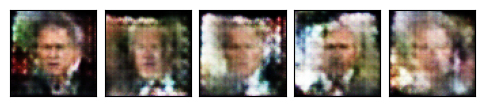

--- EPOCH 38/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.03s/it]
Discriminator loss: 0.3602086051422007
Generator loss:     3.5284591913223267


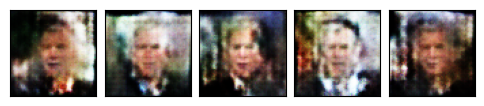

--- EPOCH 39/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.08s/it]
Discriminator loss: 0.49094445652821483
Generator loss:     3.4135201538310334


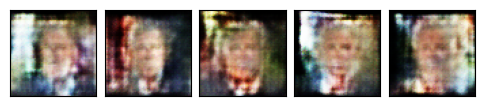

--- EPOCH 40/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.06s/it]
Discriminator loss: 0.511021193336038
Generator loss:     3.924389577963773


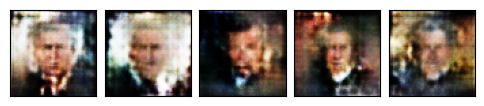

--- EPOCH 41/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.05s/it]
Discriminator loss: 0.3762427945347393
Generator loss:     3.5502797295065487


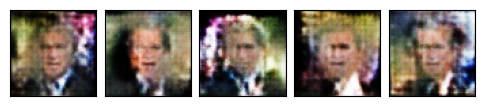

--- EPOCH 42/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.07s/it]
Discriminator loss: 0.27373772421303916
Generator loss:     3.3345462013693417


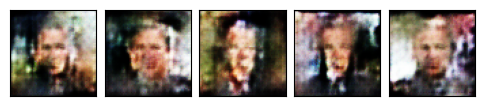

--- EPOCH 43/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.01s/it]
Discriminator loss: 0.2555997402352445
Generator loss:     3.5256721272188076


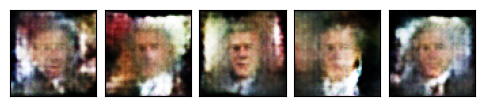

--- EPOCH 44/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.02s/it]
Discriminator loss: 1.0301438307060915
Generator loss:     4.2868680568302375


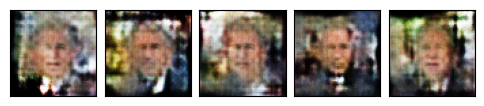

--- EPOCH 45/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.04s/it]
Discriminator loss: 0.5630170177010929
Generator loss:     3.661212619613199


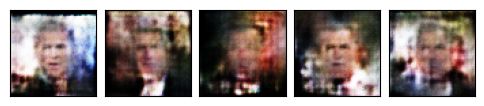

--- EPOCH 46/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.05s/it]
Discriminator loss: 0.5026687786859625
Generator loss:     3.235434623325572
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


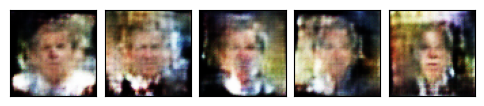

--- EPOCH 47/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.05s/it]
Discriminator loss: 0.47084878385066986
Generator loss:     3.454643775435055


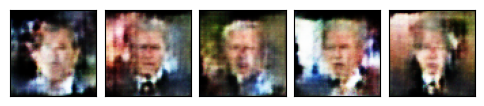

--- EPOCH 48/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.05s/it]
Discriminator loss: 0.3045160428566091
Generator loss:     3.2851054247687843


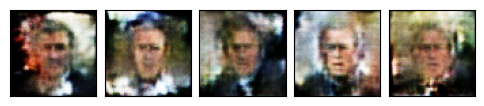

--- EPOCH 49/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.05s/it]
Discriminator loss: 0.6134295384673512
Generator loss:     3.669448435306549


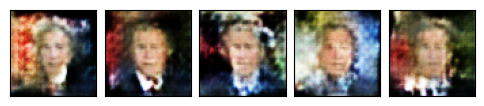

--- EPOCH 50/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.05s/it]
Discriminator loss: 0.40258582286974964
Generator loss:     3.3656742993523094


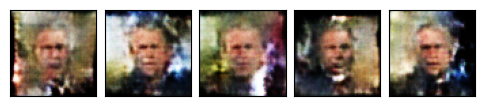

--- EPOCH 51/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.05s/it]
Discriminator loss: 0.3259083102731144
Generator loss:     3.321608031497282


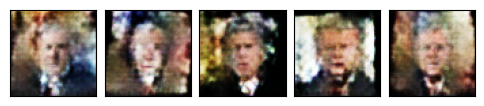

--- EPOCH 52/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.03s/it]
Discriminator loss: 0.24237224897917578
Generator loss:     3.3339455548454735


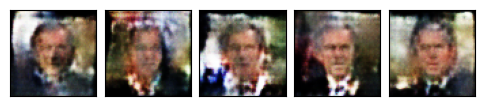

--- EPOCH 53/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.02s/it]
Discriminator loss: 0.4532405089806108
Generator loss:     3.711005280999576


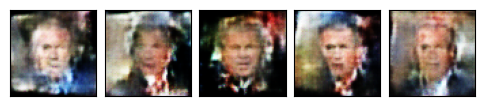

--- EPOCH 54/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.03s/it]
Discriminator loss: 0.48850728001664667
Generator loss:     3.585544880698709


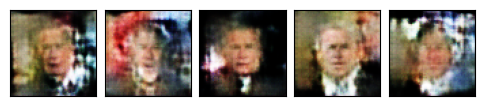

--- EPOCH 55/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.07s/it]
Discriminator loss: 0.7739831822759965
Generator loss:     3.764251337331884


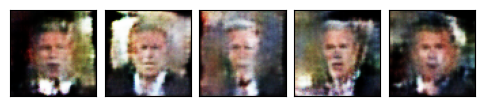

--- EPOCH 56/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.11s/it]
Discriminator loss: 0.4165562487700406
Generator loss:     2.9989884741166057
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


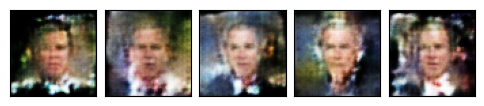

--- EPOCH 57/100 ---
100%|██████████| 17/17 [00:38<00:00,  2.24s/it]
Discriminator loss: 0.3670613564112607
Generator loss:     3.0271037536508896


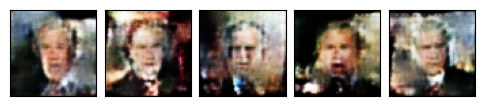

--- EPOCH 58/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.05s/it]
Discriminator loss: 0.35928064847693725
Generator loss:     3.1740836536183075


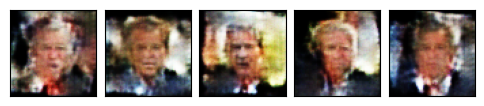

--- EPOCH 59/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.04s/it]
Discriminator loss: 0.28226155305609985
Generator loss:     3.2805578428156235


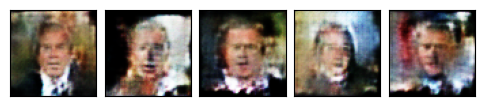

--- EPOCH 60/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.08s/it]
Discriminator loss: 0.21847506568712347
Generator loss:     3.2624754905700684


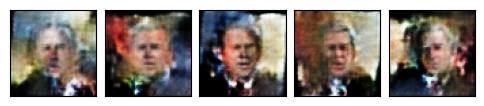

--- EPOCH 61/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.07s/it]
Discriminator loss: 0.615174815935247
Generator loss:     3.7023139490800747


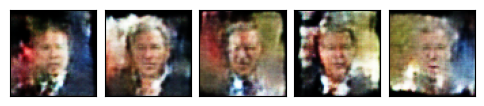

--- EPOCH 62/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.03s/it]
Discriminator loss: 0.7262437308535856
Generator loss:     3.408374085145838


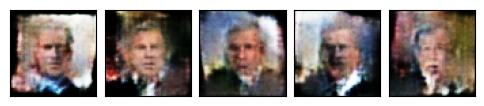

--- EPOCH 63/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.08s/it]
Discriminator loss: 0.40023136840147133
Generator loss:     2.942275447003982
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


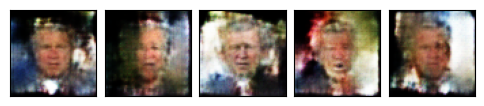

--- EPOCH 64/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.07s/it]
Discriminator loss: 0.38135981910368977
Generator loss:     3.1031151448979095


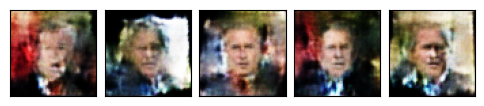

--- EPOCH 65/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.07s/it]
Discriminator loss: 0.2887577677474302
Generator loss:     3.0779123025781967


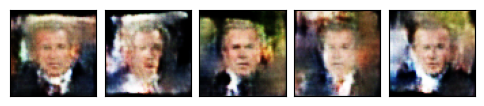

--- EPOCH 66/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.04s/it]
Discriminator loss: 0.2697775977499345
Generator loss:     3.203168939141666


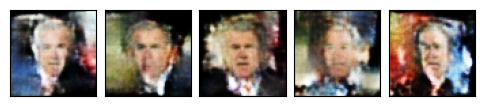

--- EPOCH 67/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.03s/it]
Discriminator loss: 1.0113803051850374
Generator loss:     3.8005548093248818


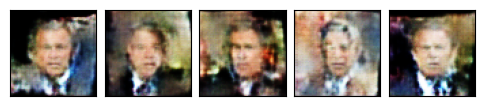

--- EPOCH 68/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.04s/it]
Discriminator loss: 0.5294459672535167
Generator loss:     3.145243700812845


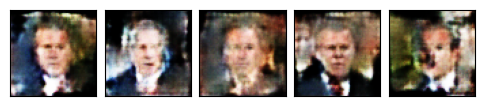

--- EPOCH 69/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.04s/it]
Discriminator loss: 0.3020872315939735
Generator loss:     2.7766410182504093
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


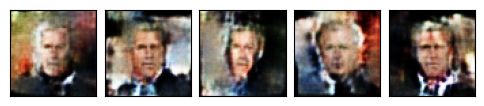

--- EPOCH 70/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.03s/it]
Discriminator loss: 0.39324527891243205
Generator loss:     3.0669790927101586


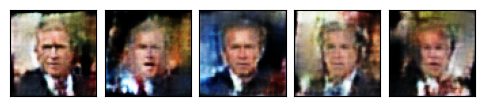

--- EPOCH 71/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.03s/it]
Discriminator loss: 0.28585530028623696
Generator loss:     3.1091778558843277


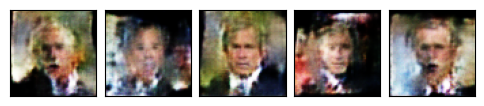

--- EPOCH 72/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.04s/it]
Discriminator loss: 0.22147145692039938
Generator loss:     3.3097556198344513


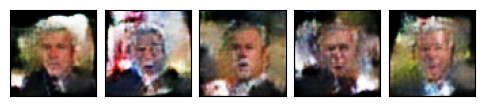

--- EPOCH 73/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.06s/it]
Discriminator loss: 0.2991382129052106
Generator loss:     3.364508874276105


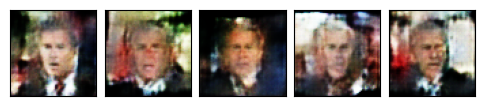

--- EPOCH 74/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.07s/it]
Discriminator loss: 0.30924712033832774
Generator loss:     3.455565193120171


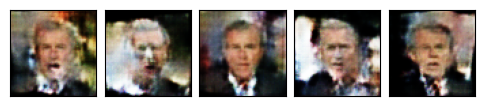

--- EPOCH 75/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.05s/it]
Discriminator loss: 0.27436305538696404
Generator loss:     3.417262512094834


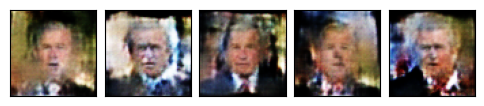

--- EPOCH 76/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.07s/it]
Discriminator loss: 0.204798145329251
Generator loss:     3.2951229460099163


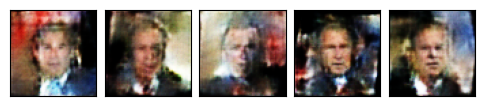

--- EPOCH 77/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.01s/it]
Discriminator loss: 0.1813479517312611
Generator loss:     3.22159462816575


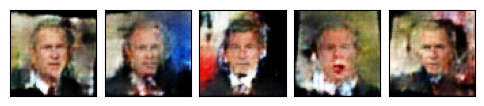

--- EPOCH 78/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.05s/it]
Discriminator loss: 1.292922721189611
Generator loss:     3.514323059907731


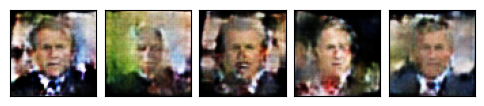

--- EPOCH 79/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.10s/it]
Discriminator loss: 0.46622264911146727
Generator loss:     2.999839845825644


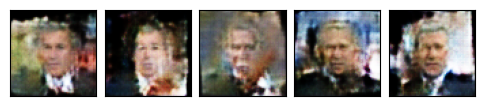

--- EPOCH 80/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.08s/it]
Discriminator loss: 0.7465469696942497
Generator loss:     3.2330901798079994


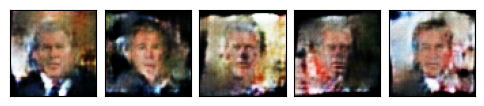

--- EPOCH 81/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.06s/it]
Discriminator loss: 0.411292924600489
Generator loss:     2.87290700042949


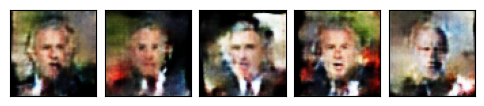

--- EPOCH 82/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.03s/it]
Discriminator loss: 0.3178427657660316
Generator loss:     2.779089976759518


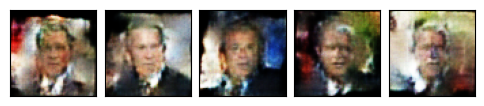

--- EPOCH 83/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.05s/it]
Discriminator loss: 0.2955911457538605
Generator loss:     3.0881861869026634


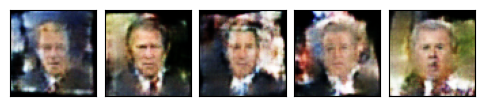

--- EPOCH 84/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.05s/it]
Discriminator loss: 0.22324622290975907
Generator loss:     2.9894149163190056


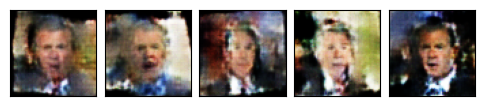

--- EPOCH 85/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.05s/it]
Discriminator loss: 0.23729152802158804
Generator loss:     3.0865658591775333


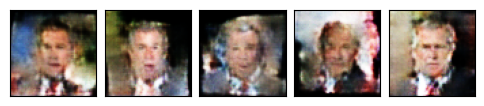

--- EPOCH 86/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.06s/it]
Discriminator loss: 0.2145986109972
Generator loss:     3.1351670657887176


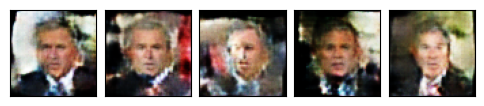

--- EPOCH 87/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.04s/it]
Discriminator loss: 1.1387860319193672
Generator loss:     3.6221669303143726


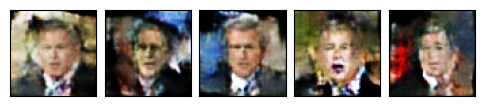

--- EPOCH 88/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.02s/it]
Discriminator loss: 0.39395804527927847
Generator loss:     3.138944759088404


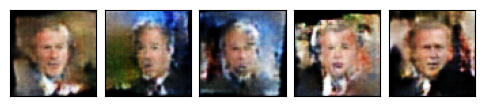

--- EPOCH 89/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.06s/it]
Discriminator loss: 0.30073590050725374
Generator loss:     2.9191612075356876


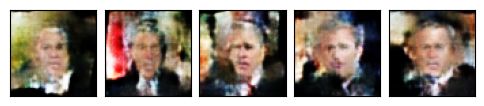

--- EPOCH 90/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.07s/it]
Discriminator loss: 0.30164066044723287
Generator loss:     3.188824920093312


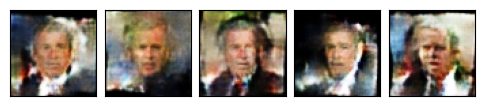

--- EPOCH 91/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.07s/it]
Discriminator loss: 0.22748973746510112
Generator loss:     3.046906316981596


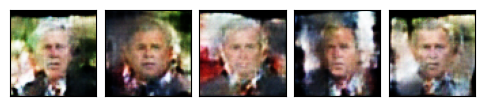

--- EPOCH 92/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.10s/it]
Discriminator loss: 0.2383512613527915
Generator loss:     3.3067980373606964


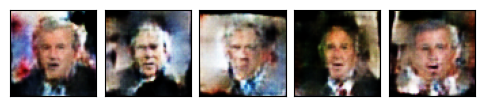

--- EPOCH 93/100 ---
100%|██████████| 17/17 [00:34<00:00,  2.05s/it]
Discriminator loss: 0.16797971374848308
Generator loss:     3.197329885819379


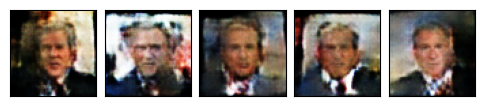

--- EPOCH 94/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.06s/it]
Discriminator loss: 0.16453465994666605
Generator loss:     3.4900362912346337


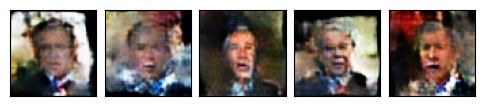

--- EPOCH 95/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.07s/it]
Discriminator loss: 1.6879272706368391
Generator loss:     3.641514709986308


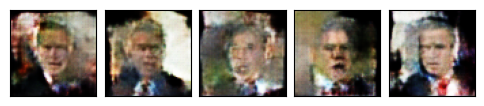

--- EPOCH 96/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.07s/it]
Discriminator loss: 0.4326120965621051
Generator loss:     2.9580067536410164


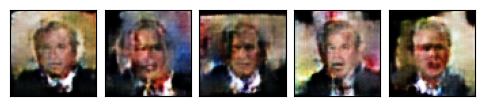

--- EPOCH 97/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.07s/it]
Discriminator loss: 0.4094310972620459
Generator loss:     3.0086823842104744


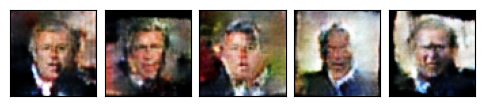

--- EPOCH 98/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.09s/it]
Discriminator loss: 0.3150988133514629
Generator loss:     2.9550103229634903


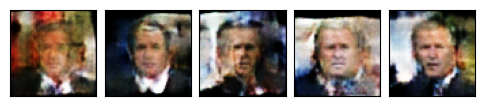

--- EPOCH 99/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.09s/it]
Discriminator loss: 0.4003479375558741
Generator loss:     2.9244888074257793


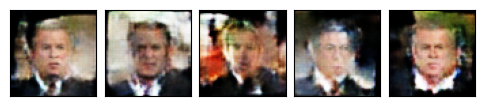

--- EPOCH 100/100 ---
100%|██████████| 17/17 [00:35<00:00,  2.12s/it]
Discriminator loss: 0.2803077759111629
Generator loss:     3.091964974122889


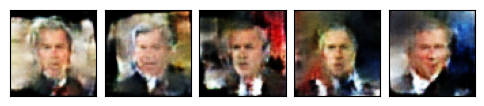

In [166]:
import IPython.display
import tqdm
from hw3.gan import train_batch, save_checkpoint

num_epochs = 100

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

*** Images Generated from best model:


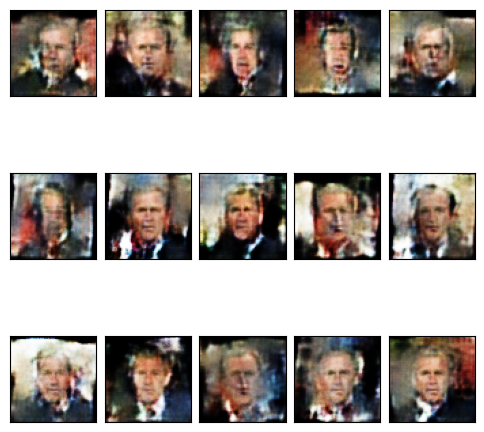

In [167]:
# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file}.pt'):
    gen = torch.load(f'{checkpoint_file}.pt', map_location=device)
print('*** Images Generated from best model:')
samples = gen.sample(n=15, with_grad=False).cpu()
fig, _ = plot.tensors_as_images(samples, nrows=3, figsize=(6,6))

## Questions
<a id=part3_8></a>

**TODO** Answer the following questions. Write your answers in the appropriate variables in the module `hw3/answers.py`.

In [1]:
from cs236781.answers import display_answer
import hw3.answers

### Question 1

Explain in detail why during training we sometimes need to maintain gradients when sampling from the GAN,
and other times we don't. When are they maintained and why? When are they discarded and why?

In [2]:
display_answer(hw3.answers.part3_q1)


**When Gradients Are Maintained:**

Discriminator Training:
During the discriminator's training phase, gradients are always maintained. This is crucial because:


1. The discriminator needs to learn to distinguish between real and fake samples
2. Backpropagation is used to update the discriminator's weights based on its performance in classifying real and generated samples
3. Gradients flow through the entire discriminator network, allowing it to learn meaningful features that can differentiate authentic and generated data

**When Gradients Are Detached/Discarded:**

Generator Training:
When training the generator, gradients from the generator's output are typically detached from the discriminator's computation. This is done for several important reasons:


1. Prevent unintended backpropagation through the entire discriminator network
2. Isolate the generator's learning process
3. Avoid computational inefficiency and potential instability in training




### Question 2

1. When training a GAN to generate images, should we decide to stop training solely based on the fact that  the Generator loss is below some threshold?
Why or why not?

2. What does it mean if the discriminator loss remains at a constant value while the generator loss decreases?

In [2]:
display_answer(hw3.answers.part3_q2)


**Question 1**
No, Generator loss alone is not a reliable sole indicator for stopping GAN training:

1. Discriminator loss is also important for training stability
2. Low generator loss could indicate mode collapse
3. Generator might learn to fool discriminator without producing meaningful images
4. Loss doesn't directly correlate with image quality

**Question 2**

Constant Discriminator Loss with Decreasing Generator Loss Suggests:


1. Potential mode collapse
2. Generator has learned to generate very similar/repetitive samples
3. Discriminator becomes "saturated" and can no longer effectively distinguish real from fake
4. Generator is exploiting a weakness in the discriminator's decision boundary
5. Training instability or lack of diversity in generated samples



### Question 3

Compare the results you got when generating images with the VAE to the GAN results.
What's the main difference and what's causing it?

In [ ]:
display_answer(hw3.answers.part3_q3)